# Health Impact Analysis
- This project is totaly focus on Air Quality and Health Impact Analysis.

# Import Packages

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Load DataSet

In [5]:
df=pd.read_csv('Urban Air Quality and Health Impact Dataset.csv')
df.head(2)

,datetime,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,City,Temp_Range,Heat_Index,Severity_Score,Condition_Code,Month,Season,Day_of_Week,Is_Weekend,Health_Risk_Score
0,2024-09-07,1.725692e+09,106.1,91.0,98.5,104.0,88.1,95.9,51.5,21.0,...,Phoenix,15.1,95.918703,4.43,NaN,9.0,Fall,Saturday,True,10.522170
1,2024-09-08,1.725779e+09,103.9,87.0,95.4,100.5,84.7,92.3,48.7,21.5,...,Phoenix,16.9,92.281316,3.88,0.0,9.0,Fall,Sunday,True,10.062332


# Data Preprocessing
- Shape of data
- Null Values
- Columns
- Duplicates Values
- Statistical Summary

In [7]:
df.shape

(1000, 46)

In [8]:
df.columns

Index(['datetime', 'datetimeEpoch', 'tempmax', 'tempmin', 'temp',
       'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity',
       'precip', 'precipprob', 'precipcover', 'preciptype', 'snow',
       'snowdepth', 'windgust', 'windspeed', 'winddir', 'pressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'severerisk', 'sunrise', 'sunriseEpoch', 'sunset', 'sunsetEpoch',
       'moonphase', 'conditions', 'description', 'icon', 'stations', 'source',
       'City', 'Temp_Range', 'Heat_Index', 'Severity_Score', 'Condition_Code',
       'Month', 'Season', 'Day_of_Week', 'Is_Weekend', 'Health_Risk_Score'],
      dtype='object')

# Observation
- There are 2 many colums so first of all we can perform some `Hypothesis Test` so that we can reduce the dimension of data

In [10]:
df.isnull().sum()

datetime               0
datetimeEpoch          0
tempmax                0
tempmin                0
temp                   0
feelslikemax           0
feelslikemin           0
feelslike              0
dew                    0
humidity               0
precip                 0
precipprob             0
precipcover            0
preciptype           622
snow                   0
snowdepth             71
windgust               0
windspeed              0
winddir                0
pressure               0
cloudcover             0
visibility             0
solarradiation         0
solarenergy            0
uvindex                0
severerisk             0
sunrise                0
sunriseEpoch           0
sunset                 0
sunsetEpoch            0
moonphase              0
conditions             0
description            0
icon                   0
stations             933
source                 0
City                   0
Temp_Range             0
Heat_Index             0
Severity_Score         0


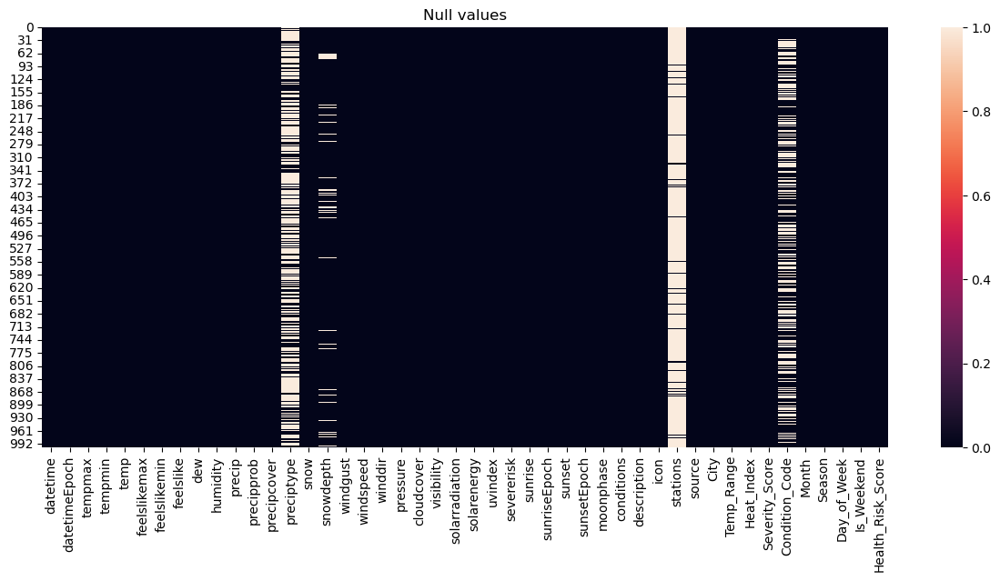

In [11]:
plt.figure(figsize=(15,6))
plt.title("Null values")
sns.heatmap(df.isnull())
plt.show()

# Observation
- Now we see that some columns contain missing values.
- If any col contain more then missing  value we cab drop the columns.
- If any column contan less the 5% missing values we can drop those rows.

In [13]:
col_to_drop=[]
for i in df.columns:
    null_ratio=df[i].isnull().mean()*100
    
    if null_ratio>0 and null_ratio<=5:
        print(f"{i} null ration {null_ratio}")
        df[i]=df[i].dropna()
    elif null_ratio>5 and null_ratio<=10:
        continue
    elif null_ratio>10:
        print(i,null_ratio)
        col_to_drop.append(i)

preciptype 62.2
stations 93.30000000000001
Condition_Code 43.1


# Observation
- We can find those colums whose contain more missing values.
- Now we can drop these columns.

In [15]:
col_to_drop

['preciptype', 'stations', 'Condition_Code']

In [16]:
df=df.drop(columns=col_to_drop)

In [17]:
df.shape

(1000, 43)

# Important
- Check the 7% missing value col

In [19]:
df['snowdepth'].value_counts()

snowdepth
0.0    929
Name: count, dtype: int64

# Observation
- All the value are 0 so these are the `constant` colum so we can drop this col

In [21]:
df.drop(columns='snowdepth',inplace=True)

# Datatypes

In [23]:
df.dtypes

datetime              object
datetimeEpoch        float64
tempmax              float64
tempmin              float64
temp                 float64
feelslikemax         float64
feelslikemin         float64
feelslike            float64
dew                  float64
humidity             float64
precip               float64
precipprob           float64
precipcover          float64
snow                 float64
windgust             float64
windspeed            float64
winddir              float64
pressure             float64
cloudcover           float64
visibility           float64
solarradiation       float64
solarenergy          float64
uvindex              float64
severerisk           float64
sunrise               object
sunriseEpoch         float64
sunset                object
sunsetEpoch          float64
moonphase            float64
conditions            object
description           object
icon                  object
source                object
City                  object
Temp_Range    

In [24]:
df.select_dtypes('number')

,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,uvindex,severerisk,sunriseEpoch,sunsetEpoch,moonphase,Temp_Range,Heat_Index,Severity_Score,Month,Health_Risk_Score
0,1.725692e+09,106.100000,91.000000,98.500000,104.000000,88.100000,95.900000,51.500000,21.000000,0.000000,...,9.000000,10.000000,1.725714e+09,1.725760e+09,0.160000,15.100000,95.918703,4.430000,9.0,10.522170
1,1.725779e+09,103.900000,87.000000,95.400000,100.500000,84.700000,92.300000,48.700000,21.500000,0.000000,...,9.000000,10.000000,1.725801e+09,1.725846e+09,0.190000,16.900000,92.281316,3.880000,9.0,10.062332
2,1.725865e+09,105.000000,83.900000,94.700000,99.900000,81.600000,90.600000,41.700000,16.900000,0.000000,...,9.000000,10.000000,1.725887e+09,1.725933e+09,0.220000,21.100000,90.599165,3.630000,9.0,9.673387
3,1.725952e+09,106.100000,81.200000,93.900000,100.600000,79.500000,89.800000,39.100000,15.700000,0.012000,...,9.000000,10.000000,1.725974e+09,1.726019e+09,0.250000,24.900000,89.638811,2.851200,9.0,9.411519
4,1.726038e+09,106.100000,82.100000,94.000000,101.000000,80.000000,90.000000,40.100000,15.900000,0.008000,...,9.000000,10.000000,1.726060e+09,1.726105e+09,0.290000,24.000000,89.760414,3.390800,9.0,9.515179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.726633e+09,76.060546,64.359387,69.002142,77.673823,63.510920,67.003338,59.936776,73.189130,0.084660,...,3.121167,10.563084,1.726691e+09,1.726616e+09,0.520096,12.886665,71.837558,1.957318,9.0,8.750142
996,1.726550e+09,68.409198,65.939319,66.567410,68.956722,64.805635,65.992526,59.010257,74.137401,0.019847,...,8.919897,9.838767,1.726594e+09,1.726666e+09,0.477557,2.613629,72.463491,2.537413,9.0,9.118198
997,1.726122e+09,69.756690,65.286919,65.919492,68.158536,63.662942,67.313322,62.024442,84.650482,-0.010133,...,9.089547,10.502440,1.726119e+09,1.726232e+09,0.318339,4.598936,67.560060,3.595470,9.0,9.880093
998,1.726284e+09,77.106797,61.481724,68.106569,76.426959,60.901526,68.094309,63.169608,86.860261,-0.002440,...,8.908550,9.847929,1.726297e+09,1.726331e+09,0.397304,15.477717,67.930437,3.498942,9.0,9.561602


In [25]:
df.select_dtypes('object')

,datetime,sunrise,sunset,conditions,description,icon,source,City,Season,Day_of_Week
0,2024-09-07,06:06:50,18:44:53,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,comb,Phoenix,Fall,Saturday
1,2024-09-08,06:07:30,18:43:32,Clear,Clear conditions throughout the day.,clear-day,fcst,Phoenix,Fall,Sunday
2,2024-09-09,06:08:10,18:42:10,Clear,Clear conditions throughout the day.,clear-day,fcst,Phoenix,Fall,Monday
3,2024-09-10,06:08:49,18:40:48,Clear,Clear conditions throughout the day.,clear-day,fcst,Phoenix,Fall,Tuesday
4,2024-09-11,06:09:29,18:39:26,Clear,Clear conditions throughout the day.,clear-day,fcst,Phoenix,Fall,Wednesday
...,...,...,...,...,...,...,...,...,...,...
995,2024-09-18,06:44:57,19:03:37,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,fcst,Philadelphia,Fall,Wednesday
996,2024-09-17,06:34:01,18:51:20,Clear,Clear conditions throughout the day.,clear-day,fcst,San Diego,Fall,Tuesday
997,2024-09-12,06:30:49,18:58:05,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,fcst,San Diego,Fall,Thursday
998,2024-09-14,06:35:57,19:00:10,Clear,Clear conditions throughout the day.,clear-day,fcst,Los Angeles,Fall,Saturday


# Observation
- We can change the datatypes of `datetime` , `sunset` and `sunrise` 

In [27]:
df['datetime']=pd.to_datetime(df['datetime'])

In [28]:
# Get the sunrise min and hour
df['sunrise_hour']=pd.to_datetime(df['sunrise']).dt.hour
df['sunrise_min']=pd.to_datetime(df['sunrise']).dt.minute

# Get the sunset min and hour
df['sunset_hour']=pd.to_datetime(df['sunset']).dt.hour
df['sunset_min']=pd.to_datetime(df['sunset']).dt.minute

# Observation
- We have month columns but it contain the month nbr now we can get the month
- we can also a day of the week

In [30]:
df['year']=df['datetime'].dt.year
df['Month']=df['datetime'].dt.month_name()

# drop the sunrise and sunset and date columns

In [32]:
df.head(2)

,datetime,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,Month,Season,Day_of_Week,Is_Weekend,Health_Risk_Score,sunrise_hour,sunrise_min,sunset_hour,sunset_min,year
0,2024-09-07,1.725692e+09,106.1,91.0,98.5,104.0,88.1,95.9,51.5,21.0,...,September,Fall,Saturday,True,10.522170,6,6,18,44,2024
1,2024-09-08,1.725779e+09,103.9,87.0,95.4,100.5,84.7,92.3,48.7,21.5,...,September,Fall,Sunday,True,10.062332,6,7,18,43,2024


In [33]:
df=df.drop(columns=['datetime','sunset','sunrise'])

In [34]:
df.head()

,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,Month,Season,Day_of_Week,Is_Weekend,Health_Risk_Score,sunrise_hour,sunrise_min,sunset_hour,sunset_min,year
0,1.725692e+09,106.1,91.0,98.5,104.0,88.1,95.9,51.5,21.0,0.000,...,September,Fall,Saturday,True,10.522170,6,6,18,44,2024
1,1.725779e+09,103.9,87.0,95.4,100.5,84.7,92.3,48.7,21.5,0.000,...,September,Fall,Sunday,True,10.062332,6,7,18,43,2024
2,1.725865e+09,105.0,83.9,94.7,99.9,81.6,90.6,41.7,16.9,0.000,...,September,Fall,Monday,False,9.673387,6,8,18,42,2024
3,1.725952e+09,106.1,81.2,93.9,100.6,79.5,89.8,39.1,15.7,0.012,...,September,Fall,Tuesday,False,9.411519,6,8,18,40,2024
4,1.726038e+09,106.1,82.1,94.0,101.0,80.0,90.0,40.1,15.9,0.008,...,September,Fall,Wednesday,False,9.515179,6,9,18,39,2024


# Statistical Summary

In [36]:
df.describe(include='number')

,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,moonphase,Temp_Range,Heat_Index,Severity_Score,Health_Risk_Score,sunrise_hour,sunrise_min,sunset_hour,sunset_min,year
count,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.0
mean,1.726284e+09,85.106961,68.641638,76.115967,85.195384,68.547548,76.323286,57.267120,56.782281,0.032135,...,0.383811,16.469899,80.195613,3.057743,9.729103,6.280000,26.645000,18.692000,27.642000,2024.0
std,3.745834e+05,9.524231,8.474102,8.722070,9.496951,8.365809,8.621361,9.161517,16.708667,0.083461,...,0.147229,5.552785,6.053805,0.624024,0.679728,0.449224,14.074981,0.461898,18.123142,0.0
min,1.725624e+09,62.035432,49.108218,55.548415,62.206413,48.834041,57.748822,26.261814,11.752135,-0.021213,...,0.123494,1.676587,65.511677,1.578048,8.492431,6.000000,2.000000,18.000000,0.000000,2024.0
25%,1.725948e+09,78.661118,62.678245,69.102499,78.485332,62.734961,68.930104,51.229378,49.982029,-0.000511,...,0.247940,13.319119,76.287207,2.583375,9.195244,6.000000,13.000000,18.000000,10.000000,2024.0
50%,1.726285e+09,84.322847,67.702405,75.222751,84.284077,67.844544,75.544961,58.598490,58.486182,0.004000,...,0.385185,16.694710,78.562345,3.026242,9.546156,6.000000,30.000000,19.000000,28.000000,2024.0
75%,1.726616e+09,91.653987,75.585109,82.396698,93.757026,75.591093,84.309449,62.738294,66.560400,0.015258,...,0.516248,20.734495,85.318985,3.507127,10.242523,7.000000,37.000000,19.000000,43.000000,2024.0
max,1.727021e+09,107.797400,91.635546,99.851684,105.060170,89.369854,98.193984,76.648668,92.459293,0.471666,...,0.649488,29.790757,96.684162,5.158112,11.485725,7.000000,55.000000,19.000000,59.000000,2024.0


In [37]:
for col in df.describe(include='object').columns:
    print("Unique Values in: ",col)
    print(df[col].unique())
    print(f"Total unique values are {df[col].nunique()}")
    print("*"*100)
    print()

Unique Values in:  conditions
['Partially cloudy' 'Clear' 'Overcast' 'Rain, Partially cloudy']
Total unique values are 4
****************************************************************************************************

Unique Values in:  description
['Partly cloudy throughout the day.'
 'Clear conditions throughout the day.' 'Cloudy skies throughout the day.'
 'Becoming cloudy in the afternoon.' 'Clearing in the afternoon.'
 'Partly cloudy throughout the day with rain in the morning and afternoon.'
 'Partly cloudy throughout the day with a chance of rain.'
 'Partly cloudy throughout the day with afternoon rain.'
 'Partly cloudy throughout the day with a chance of rain throughout the day.'
 'Partly cloudy throughout the day with storms possible.'
 'Clear conditions throughout the day with storms possible.'
 'Becoming cloudy in the afternoon with storms possible.']
Total unique values are 12
*********************************************************************************************

# Observation
- We can see that data contain only single month and also have a single season.
- Value in season and month are not change so these are constant value so we can drop these values.
- we can also drop the year colum b/c it can also be not change

In [39]:
temp=df.copy()

In [40]:
temp.drop(columns=['Month','Season','year'],inplace=True)

In [41]:
temp.head()

,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,Temp_Range,Heat_Index,Severity_Score,Day_of_Week,Is_Weekend,Health_Risk_Score,sunrise_hour,sunrise_min,sunset_hour,sunset_min
0,1.725692e+09,106.1,91.0,98.5,104.0,88.1,95.9,51.5,21.0,0.000,...,15.1,95.918703,4.4300,Saturday,True,10.522170,6,6,18,44
1,1.725779e+09,103.9,87.0,95.4,100.5,84.7,92.3,48.7,21.5,0.000,...,16.9,92.281316,3.8800,Sunday,True,10.062332,6,7,18,43
2,1.725865e+09,105.0,83.9,94.7,99.9,81.6,90.6,41.7,16.9,0.000,...,21.1,90.599165,3.6300,Monday,False,9.673387,6,8,18,42
3,1.725952e+09,106.1,81.2,93.9,100.6,79.5,89.8,39.1,15.7,0.012,...,24.9,89.638811,2.8512,Tuesday,False,9.411519,6,8,18,40
4,1.726038e+09,106.1,82.1,94.0,101.0,80.0,90.0,40.1,15.9,0.008,...,24.0,89.760414,3.3908,Wednesday,False,9.515179,6,9,18,39


# Observation
- we can see that we have a lot of columns and we can't use all the columns and now we can do `Hypothesis tetsing`

# Hypothesis Testing
## Num Col -> Num Col (Variance Inflence Threshold)
## Num Col -> num_target (p_corelation)

# Apply Variance Inflence factore(VIF)

In [45]:
# saperate numerical and target col
num_col=temp.select_dtypes(include='number').columns

In [46]:
num_col

Index(['datetimeEpoch', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'snow', 'windgust', 'windspeed', 'winddir', 'pressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'severerisk', 'sunriseEpoch', 'sunsetEpoch', 'moonphase', 'Temp_Range',
       'Heat_Index', 'Severity_Score', 'Health_Risk_Score', 'sunrise_hour',
       'sunrise_min', 'sunset_hour', 'sunset_min'],
      dtype='object')

# Observation
- We can check the Variance Inflence Threshold of num col to other numerical col.

In [48]:
# Apply  VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [49]:
col_to_drop=[]
vif_data=temp[num_col]
column_index=0
for i in range(num_col.shape[0]):
    # variance_inflation_factor(dataframe,index)
    vif_value=variance_inflation_factor(vif_data,column_index)
    print(i,"------->",vif_value)
    if(vif_value<6):
        col_to_drop.append(num_col[i])
        column_index+=1
    else:
        # We can direcly remove the col to avoid the multi-colanarity
        vif_data=vif_data.drop(columns=num_col[i])

0 -------> 87.64407035372743
1 -------> 83.84664295448916
2 -------> 72.05023210715248
3 -------> 68.84412243307867
4 -------> 44.174619327243605
5 -------> 38.22608634508888
6 -------> 21.71308934154182
7 -------> 6.57539910074455
8 -------> 23.77520850525034
9 -------> 2.016371266329281
10 -------> 3.966530180875481
11 -------> 4.311359430800517
12 -------> nan
13 -------> 47.47450573395965
14 -------> 2.952526679182001
15 -------> 3.461772422090395
16 -------> 3.5845658860811027
17 -------> 2.2822927854493122
18 -------> 3.2304482838530952
19 -------> 60.93349563228454
20 -------> 4.891486296517283
21 -------> 5.833422609532953
22 -------> 2.346494708469697
23 -------> 62.19607678364882
24 -------> 128710.75452535882
25 -------> 162.10968002212283
26 -------> 28.432380125824352
27 -------> 525.804880466654
28 -------> 118.64020109617756
29 -------> 750.1959435379347
30 -------> 4261.252497087841
31 -------> 10.751144276626004
32 -------> 5377.401389548319
33 -------> 4.4552692520993

In [50]:
col_to_drop

['precip',
 'precipprob',
 'precipcover',
 'windspeed',
 'winddir',
 'pressure',
 'cloudcover',
 'visibility',
 'solarenergy',
 'uvindex',
 'severerisk',
 'sunset_min']

# Observation
- Now we can succcessfully apply the `Variance Inflence factore`.
- `col_to_drop` are the column whose p_value is not match the conditon so we ca drop these columns.
- We can not only drop the less correlated col we can also drop those who can perform multicolarity.
- We will confirm this by using scatter plot.

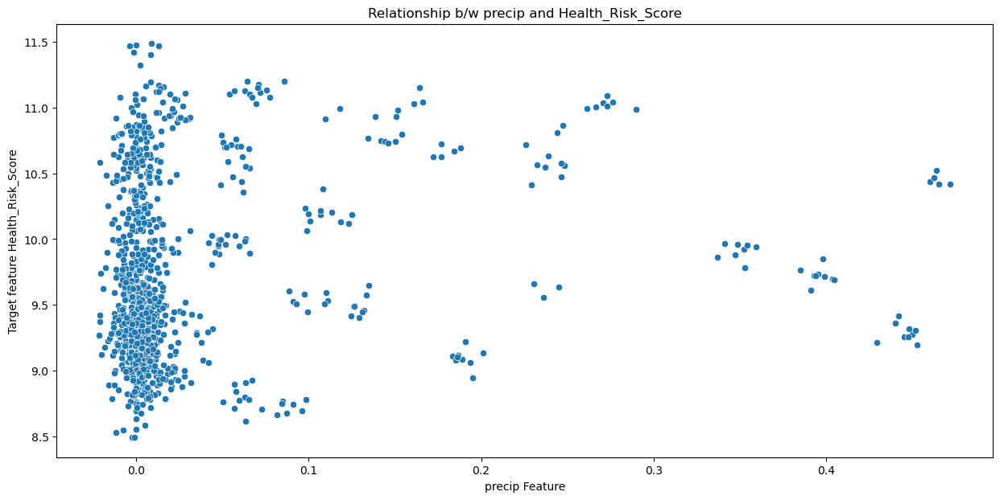

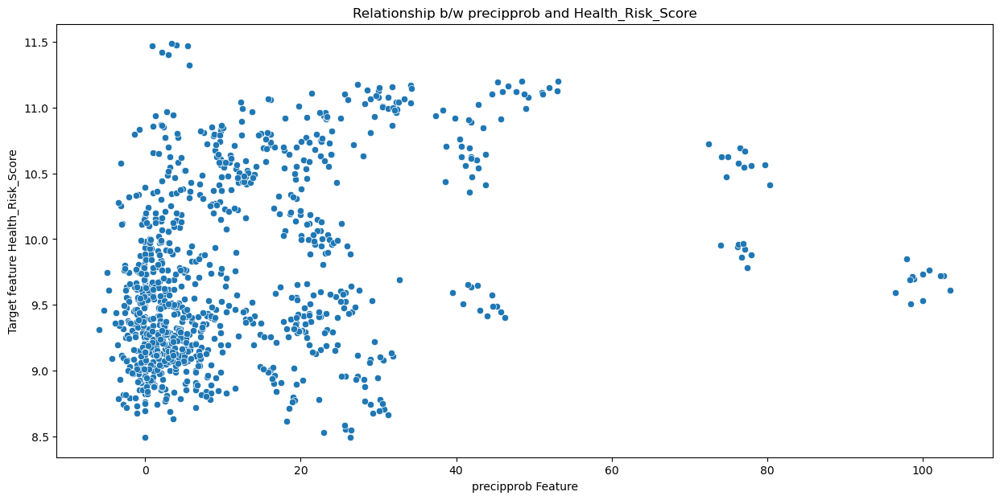

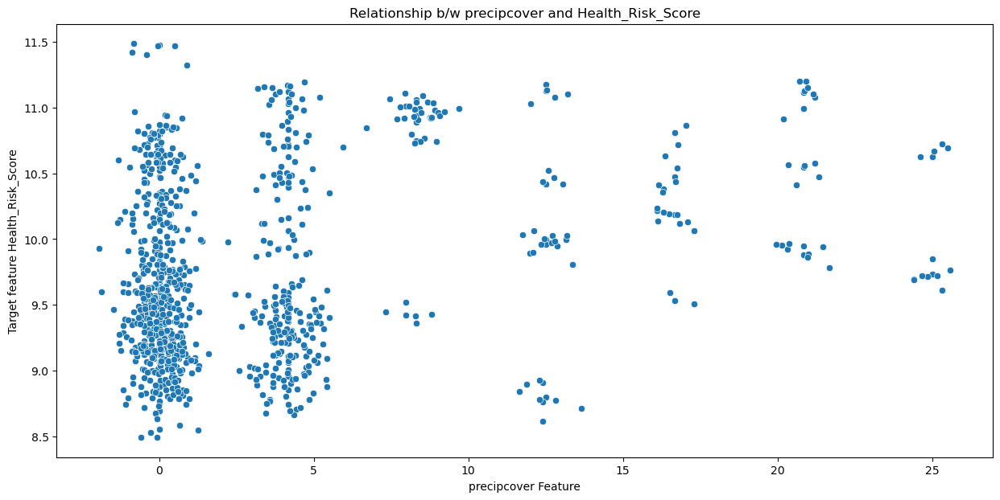

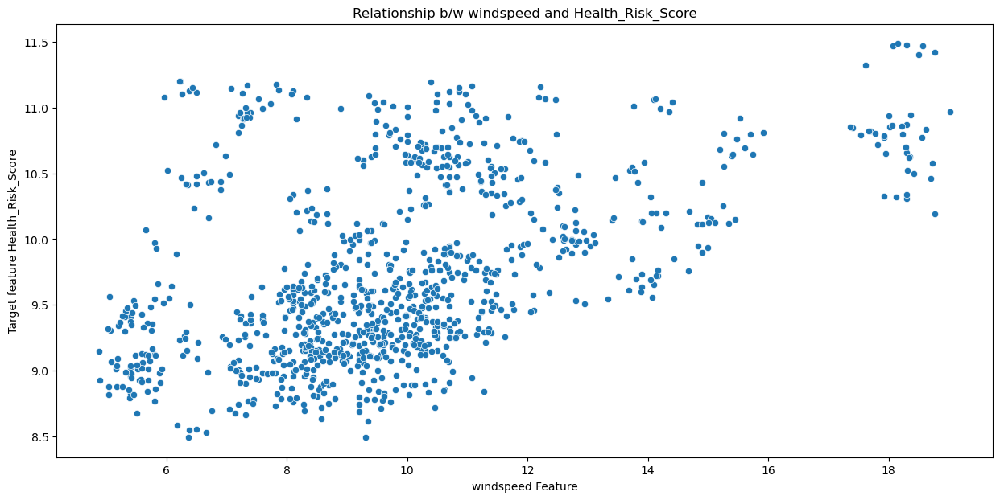

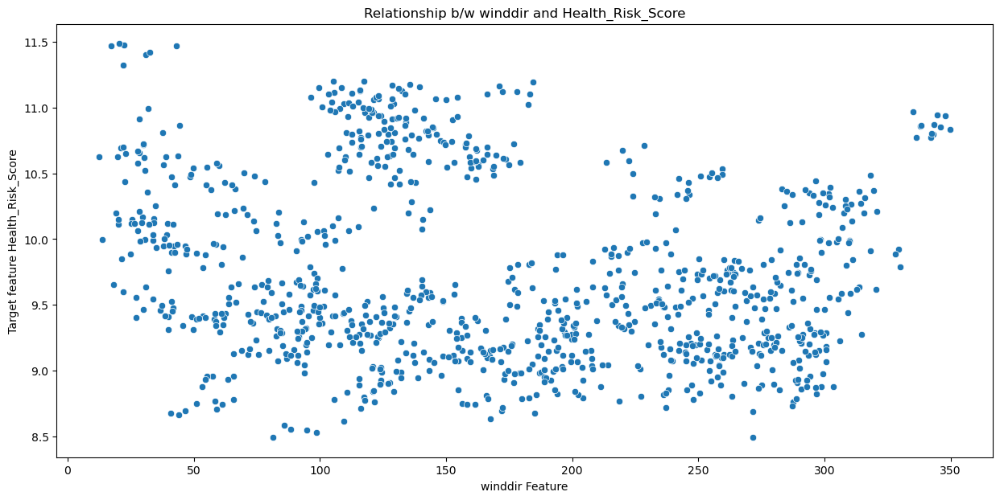

...

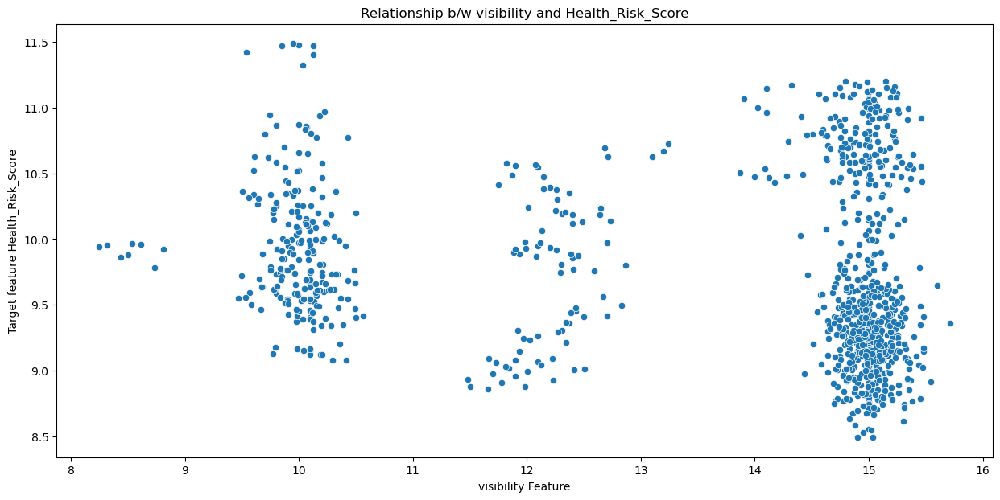

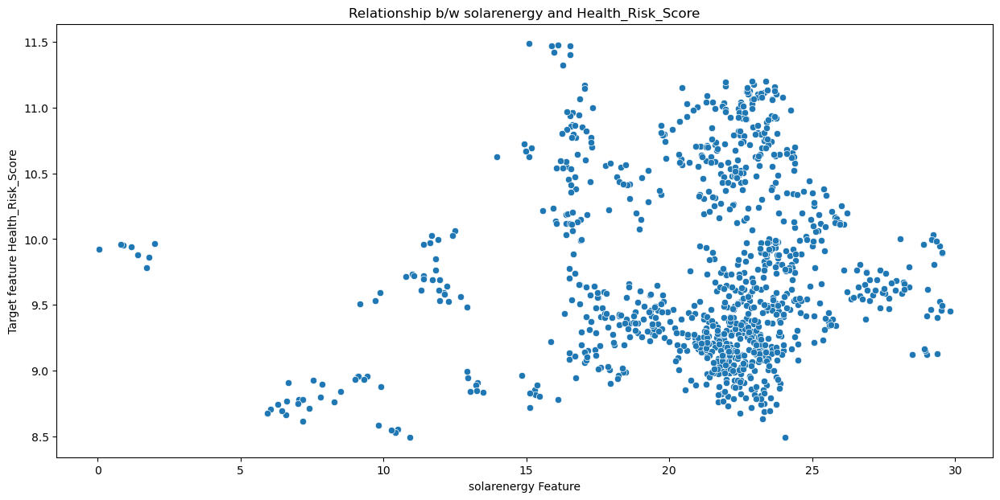

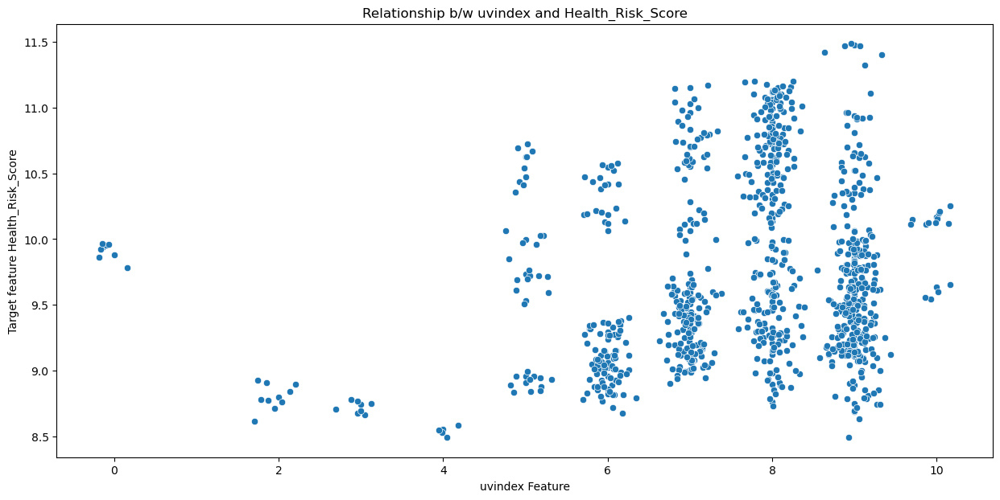

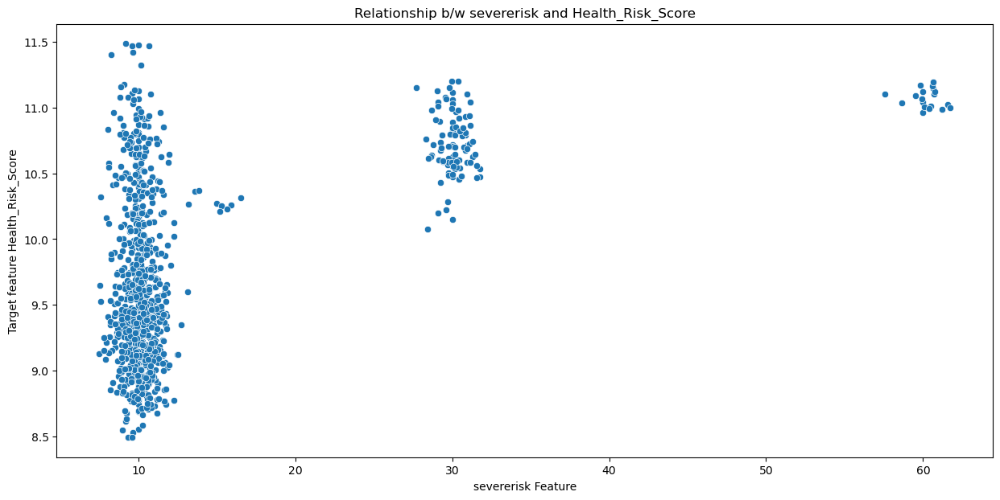

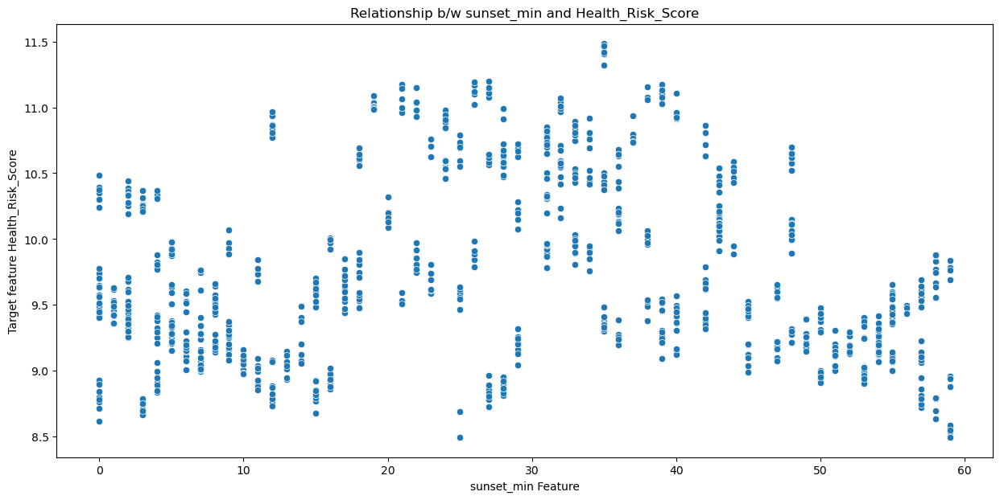

In [60]:
import matplotlib.pyplot as plt

for col in col_to_drop:
    plt.figure(figsize=(15,7))
    plt.title(f"Relationship b/w {col} and Health_Risk_Score")
    sns.scatterplot(x=temp[col], y=temp['Health_Risk_Score'])
    plt.xlabel(f'{col} Feature')
    plt.ylabel(f'Target feature Health_Risk_Score')
plt.show() 

# Observation
- We can clearly see that there is not linear relationship.

In [62]:
temp.drop(columns=col_to_drop,inplace=True)

In [63]:
temp.head(2)

,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,snow,...,City,Temp_Range,Heat_Index,Severity_Score,Day_of_Week,Is_Weekend,Health_Risk_Score,sunrise_hour,sunrise_min,sunset_hour
0,1.725692e+09,106.1,91.0,98.5,104.0,88.1,95.9,51.5,21.0,0.0,...,Phoenix,15.1,95.918703,4.43,Saturday,True,10.522170,6,6,18
1,1.725779e+09,103.9,87.0,95.4,100.5,84.7,92.3,48.7,21.5,0.0,...,Phoenix,16.9,92.281316,3.88,Sunday,True,10.062332,6,7,18


# Persion Correlation(Num_col target col)

In [76]:
from scipy.stats import pearsonr

In [88]:
num_col=[col for col in num_col if col !='Health_Risk_Score']
num_col=[col for col in num_col if col not in col_to_drop]
target_col='Health_Risk_Score'

In [90]:
# apply the p_correlation
for col in num_col:
    try:
        corr,p_value=pearsonr(temp[target_col],temp[col])
    
        if p_value>=0.5:
            print(f"{col} => p_value => {p_value} ,==> corr ==> {corr}")
    except Exception as e:
        print(e)

# Observation
- Now remaining all the numerical col will match the condition.

# EDA

In [94]:
temp.head(2)

,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,snow,...,City,Temp_Range,Heat_Index,Severity_Score,Day_of_Week,Is_Weekend,Health_Risk_Score,sunrise_hour,sunrise_min,sunset_hour
0,1.725692e+09,106.1,91.0,98.5,104.0,88.1,95.9,51.5,21.0,0.0,...,Phoenix,15.1,95.918703,4.43,Saturday,True,10.522170,6,6,18
1,1.725779e+09,103.9,87.0,95.4,100.5,84.7,92.3,48.7,21.5,0.0,...,Phoenix,16.9,92.281316,3.88,Sunday,True,10.062332,6,7,18


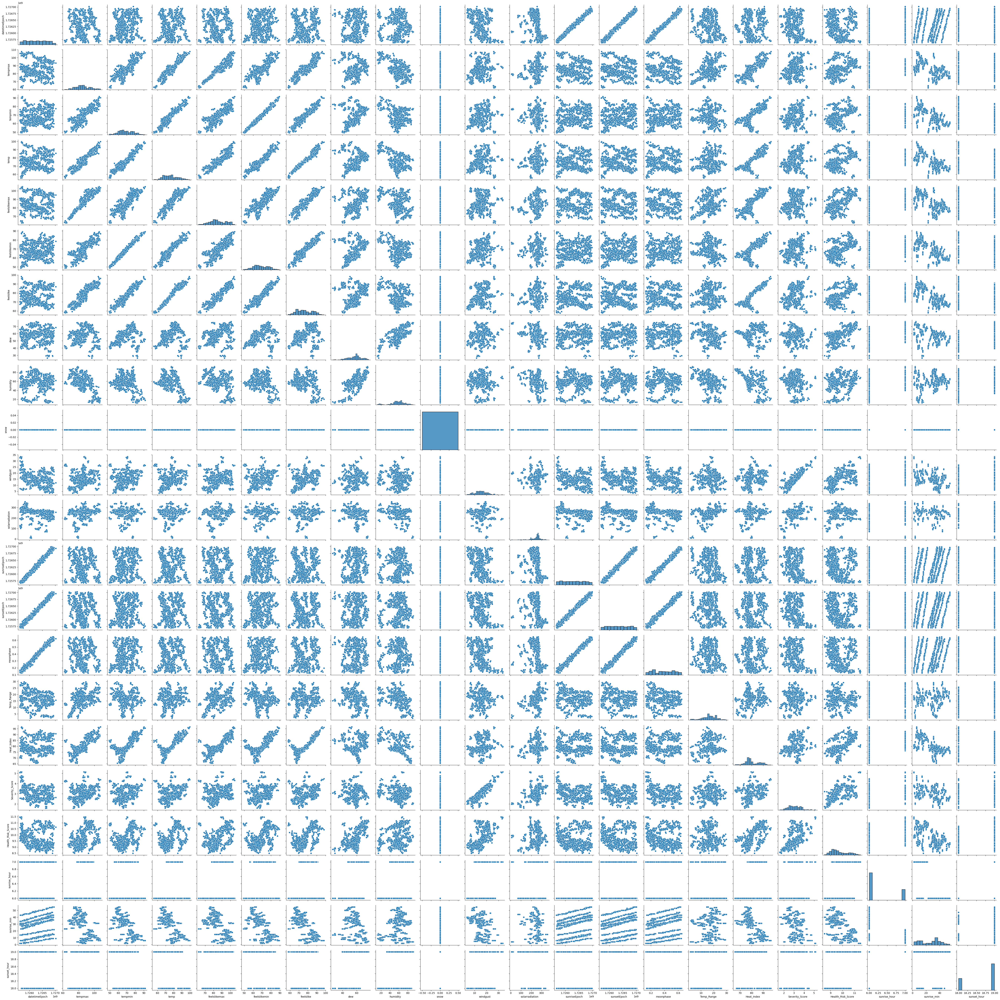

In [96]:
sns.pairplot(temp.select_dtypes('number'))

# Saperate Feature and label

In [99]:
feature=temp.drop(columns=['Health_Risk_Score'])
label=temp['Health_Risk_Score']

# Train test split

In [102]:
from sklearn.model_selection import train_test_split

In [104]:
x_train,x_test,y_train,y_test=train_test_split(feature,label,test_size=0.2,random_state=43)

# saperate num col and categorical col and text col

In [171]:
num_col=feature.select_dtypes('number').columns
text_col=['description']
cat_col=feature.drop(columns=['description']).select_dtypes('object').columns

In [173]:
num_col

Index(['datetimeEpoch', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'snow', 'windgust',
       'solarradiation', 'sunriseEpoch', 'sunsetEpoch', 'moonphase',
       'Temp_Range', 'Heat_Index', 'Severity_Score', 'sunrise_hour',
       'sunrise_min', 'sunset_hour'],
      dtype='object')

In [175]:
cat_col

Index(['conditions', 'icon', 'source', 'City', 'Day_of_Week'], dtype='object')

In [177]:
text_col

['description']

# Build a Pipeline

In [180]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.compose import ColumnTransformer

In [182]:
num_pipe=Pipeline(steps=[
    ("impute",SimpleImputer(strategy='mean')),
    ('scale',StandardScaler())
])
num_pipe

Pipeline(steps=[('impute', SimpleImputer()), ('scale', StandardScaler())])

In [184]:
cat_pipe=Pipeline(steps=[
    ("impute",SimpleImputer(strategy='most_frequent')),
    ('encode',OneHotEncoder(drop='first',sparse_output=False,handle_unknown='ignore'))
])
cat_pipe

Pipeline(steps=[('impute', SimpleImputer(strategy='most_frequent')),
                ('encode',
                 OneHotEncoder(drop='first', handle_unknown='ignore',
                               sparse_output=False))])

In [195]:
def text_transform():
    return TfidfVectorizer(max_features=500)

In [199]:
# Apply text transformer to each text column
text_transformers = [(col, text_transform(), col) for col in text_col]
text_transformers

[('description', TfidfVectorizer(max_features=500), 'description')]

In [206]:
# build column transformer
transformer=ColumnTransformer(transformers=[
    ('num_trans',num_pipe,num_col),
    ('cat_trans',cat_pipe,cat_col),
    *text_transformers
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('num_trans',
                                 Pipeline(steps=[('impute', SimpleImputer()),
                                                 ('scale', StandardScaler())]),
                                 Index(['datetimeEpoch', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'snow', 'windgust',
       'solarradiation', 'sunriseEpoch', 'sunsetEpoch', 'moonphase',
       'Temp_Range', 'Heat_Index...
       'sunrise_min', 'sunset_hour'],
      dtype='object')),
                                ('cat_trans',
                                 Pipeline(steps=[('impute',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encode',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 Index(['conditions', 'icon', 'source', 'City', 'Day_of_Week'], dtype='object')),
                                ('description',
                                 TfidfVectorizer(max_features=500),
                                 'description')])

In [259]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

In [261]:
# final pipeline
model_pipe=Pipeline(steps=[
    ('transformer',transformer),
    ('model',RandomForestRegressor())
])
model_pipe

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num_trans',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer()),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  Index(['datetimeEpoch', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'snow', 'windgust',
       'solarradiation', 'sunriseEpoch', 'sunsetEpoch', 'moon...
      dtype='object')),
                                                 ('cat_trans',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encode',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['conditions', 'icon', 'source', 'City', 'Day_of_Week'], dtype='object')),
                                                 ('description',
                                                  TfidfVectorizer(max_features=500),
                                                  'description')])),
                ('model', RandomForestRegressor())])

In [263]:
model_pipe.fit(x_train,y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num_trans',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer()),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  Index(['datetimeEpoch', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'snow', 'windgust',
       'solarradiation', 'sunriseEpoch', 'sunsetEpoch', 'moon...
      dtype='object')),
                                                 ('cat_trans',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encode',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index(['conditions', 'icon', 'source', 'City', 'Day_of_Week'], dtype='object')),
                                                 ('description',
                                                  TfidfVectorizer(max_features=500),
                                                  'description')])),
                ('model', RandomForestRegressor())])

In [265]:
y_pred=model_pipe.predict(x_test)

In [267]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

In [269]:
def calculate_metrics(actual, pred, n_samples, n_features):
    r2 = r2_score(actual, pred)
    adjusted_r2 = 1 - ((1 - r2) * (n_samples - 1) / (n_samples - n_features - 1))
    
    return {
        "R2 Score": r2,
        "Adjusted R2 Score": adjusted_r2,
        "MAE": mean_absolute_error(actual, pred),
        "MSE": mean_squared_error(actual, pred)
    }

In [271]:
calculate_metrics(y_test,y_pred,x_train.shape[0],x_train.shape[1])

{'R2 Score': 0.9565313758200877,
 'Adjusted R2 Score': 0.954952748742218,
 'MAE': 0.07962598534721768,
 'MSE': 0.019763720043798717}

In [273]:
# cross validation
from sklearn.model_selection import cross_val_score

In [275]:
train_score=cross_val_score(model_pipe,x_train,y_train,cv=5,scoring='r2').mean()
test_score=cross_val_score(model_pipe,x_test,y_test,cv=5,scoring='r2').mean()

In [276]:
train_score

0.9735344296503319

In [277]:
test_score

0.891758048167911

In [287]:
importances=model_pipe.named_steps['model'].feature_importances_

In [304]:
# Assuming your transformer is a ColumnTransformer
transformed_feature_names = model_pipe.named_steps['transformer'].get_feature_names_out()

# Now, importances and transformed_feature_names should match
importances = model_pipe.named_steps['model'].feature_importances_

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({
    'Feature': transformed_feature_names,
    'Importance': importances
})

# Sort and plot the feature importances
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

                           Feature  Importance
7                   num_trans__dew    0.548142
10             num_trans__windgust    0.174148
17       num_trans__Severity_Score    0.091871
1               num_trans__tempmax    0.039208
16           num_trans__Heat_Index    0.029547
..                             ...         ...
21  cat_trans__conditions_Overcast    0.000008
56           description__possible    0.000008
53            description__morning    0.000006
44                description__and    0.000001
9                  num_trans__snow    0.000000

[64 rows x 2 columns]


In [312]:
top_n_features=feature_importance_df[feature_importance_df['Importance']!=0]['Feature'].tolist()

In [314]:
# Create a new dataset with only the important features
X_train_important = pd.DataFrame(model_pipe.named_steps['transformer'].transform(x_train), columns=transformed_feature_names)[top_n_features]

# Optionally, split into train/test sets again
X_train_imp, X_test_imp, y_train_imp, y_test_imp = train_test_split(X_train_important, y_train, test_size=0.2, random_state=42)

# Retrain the model on the important features
rf_important = RandomForestRegressor(n_estimators=100, random_state=42)
rf_important.fit(X_train_imp, y_train_imp)

# Evaluate the model
score = rf_important.score(X_test_imp, y_test_imp)
print(f"Model score on important features: {score}")

Model score on important features: 0.9626003101906095
